In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium


#For Data Cleaning
from sklearn.impute import SimpleImputer

#For EDA
from scipy import stats
from scipy.stats import norm, skew
import pickle
from scipy.stats import shapiro


In [ ]:
df = pd.read_csv('uber_DA.csv')

- Day	.dt.dayofweek
- Monday	0
-  uesday	1
- Wednesday	2
- Thursday	3
- Friday	4
- Saturday	5
- Sunday	6

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 191852 entries, 0 to 191851
Data columns (total 18 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   fare_amount            191852 non-null  float64
 1   pickup_datetime        191852 non-null  object 
 2   pickup_longitude       191852 non-null  float64
 3   pickup_latitude        191852 non-null  float64
 4   dropoff_longitude      191852 non-null  float64
 5   dropoff_latitude       191852 non-null  float64
 6   passenger_count        191852 non-null  int64  
 7   hour                   191852 non-null  int64  
 8   minute                 191852 non-null  int64  
 9   pickup_dayofweek       191852 non-null  int64  
 10  pickup_month           191852 non-null  int64  
 11  pickup_year            191852 non-null  int64  
 12  is_weekend             191852 non-null  int64  
 13  time_period            191852 non-null  object 
 14  distance_km            191852 non-nu

In [ ]:
df.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,minute,pickup_dayofweek,pickup_month,pickup_year,is_weekend,distance_km,manhattan_distance_km,bearing
count,191852.000000,191852.000000,191852.000000,191852.000000,191852.000000,191852.000000,191852.000000,191852.000000,191852.000000,191852.000000,191852.000000,191852.000000,191852.000000,191852.000000,191852.000000
mean,11.197698,-73.975896,40.750875,-73.974925,40.751141,1.683855,13.495121,29.526625,3.047902,6.281363,2011.746023,0.283369,3.326297,4.278036,153.605091
std,9.345616,0.034222,0.026703,0.033930,0.030536,1.307097,6.512092,17.338937,1.946421,3.442189,1.860444,0.450635,3.569020,4.696048,103.713544
min,2.500000,-75.419276,40.002405,-74.535277,40.005487,0.000000,0.000000,0.000000,0.000000,1.000000,2009.000000,0.000000,0.000084,0.000084,0.000000
25%,6.000000,-73.992283,40.736534,-73.991615,40.735446,1.000000,9.000000,14.000000,1.000000,3.000000,2010.000000,0.000000,1.285377,1.634526,44.482217
50%,8.500000,-73.982176,40.753276,-73.980660,40.753720,1.000000,14.000000,30.000000,3.000000,6.000000,2012.000000,0.000000,2.177580,2.788943,171.047265
75%,12.500000,-73.968716,40.767434,-73.965950,40.768252,2.000000,19.000000,45.000000,5.000000,9.000000,2013.000000,1.000000,3.909508,5.032533,222.646625
max,230.000000,-73.506178,41.289703,-73.515512,41.500000,6.000000,23.000000,59.000000,6.000000,12.000000,2015.000000,1.000000,121.133668,127.751886,359.997803


In [ ]:
# count for far or rare locations
print("Number of suspected coordinates:", df['suspected_coordinate'].sum())


Number of suspected coordinates: 21999


In [ ]:
nyc_bounds = {'lon_min': -74.3, 'lon_max': -73.7, 'lat_min': 40.5, 'lat_max': 41.0}
out_of_nyc = df[~(
    (df['pickup_longitude'].between(nyc_bounds['lon_min'], nyc_bounds['lon_max'])) &
    (df['pickup_latitude'].between(nyc_bounds['lat_min'], nyc_bounds['lat_max'])) &
    (df['dropoff_longitude'].between(nyc_bounds['lon_min'], nyc_bounds['lon_max'])) &
    (df['dropoff_latitude'].between(nyc_bounds['lat_min'], nyc_bounds['lat_max'])))
]
out_of_nyc['suspected_coordinate'].sum()

np.int64(85)

In [ ]:
out_of_nyc

,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,minute,pickup_dayofweek,pickup_month,pickup_year,is_weekend,time_period,distance_km,manhattan_distance_km,bearing,suspected_coordinate
3838,29.3,2012-03-26 14:55:29+00:00,-73.789572,40.646957,-73.686853,40.694297,3,14,55,0,3,2012,0,Afternoon,10.137007,13.902653,58.682375,True
5387,58.5,2015-02-05 13:32:13+00:00,-73.871597,40.774010,-73.584435,40.737122,2,13,32,3,2,2015,0,Afternoon,24.533163,28.239996,99.530906,True
8709,126.1,2011-06-13 15:46:00+00:00,-73.788657,40.640643,-74.001350,41.048048,1,15,46,0,6,2011,0,Afternoon,48.706397,63.081848,338.518514,True
8894,6.5,2009-06-13 17:39:00+00:00,-73.712800,40.653922,-73.699587,40.661300,3,17,39,5,6,2009,1,Evening,1.383954,1.931578,53.640292,True
9879,35.0,2013-07-01 17:50:10+00:00,-73.783266,40.648591,-73.685152,40.686309,1,17,50,0,7,2013,0,Evening,9.277277,12.447310,63.090932,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185213,8.9,2009-04-21 18:17:07+00:00,-73.506178,40.757949,-73.515512,40.783062,1,18,17,1,4,2009,0,Evening,2.900961,3.572194,344.281938,True
187146,15.7,2011-08-12 22:10:59+00:00,-73.790100,40.647000,-73.666500,40.584600,0,22,10,4,8,2011,0,Night,12.529397,17.340836,123.586715,True
189007,30.0,2014-12-10 09:56:00+00:00,-73.781310,40.646700,-73.691822,40.653412,1,9,56,2,12,2014,0,Morning,7.586365,8.281351,84.325002,True
189198,15.7,2011-07-19 12:48:00+00:00,-74.015575,40.707432,-74.015913,41.500000,1,12,48,1,7,2011,0,Afternoon,88.129667,88.003319,359.981699,True


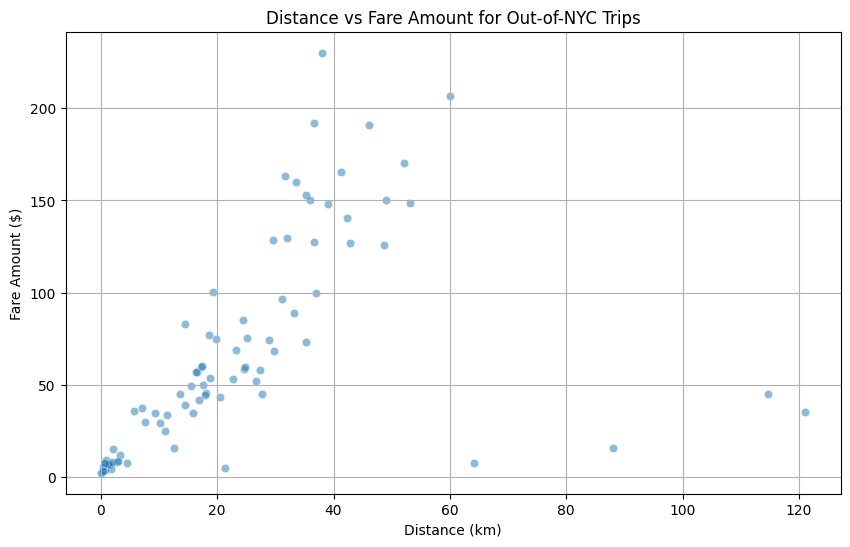

In [ ]:
# distance and fare amount

plt.figure(figsize=(10, 6))
sns.scatterplot(data=out_of_nyc, x='distance_km', y='fare_amount', alpha=0.5)

plt.title('Distance vs Fare Amount for Out-of-NYC Trips')
plt.xlabel('Distance (km)')
plt.ylabel('Fare Amount ($)')
plt.grid(True)
plt.show()

In [ ]:
# draw places outside nyc
# Center the map around NYC roughly
m = folium.Map(location=[40.7128, -74.0060], zoom_start=10)
# Plot each out-of-NYC pickup location
for idx, row in out_of_nyc.iterrows():
    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

# Optional: also plot drop-off locations
for idx, row in out_of_nyc.iterrows():
    folium.CircleMarker(
        location=[row['dropoff_latitude'], row['dropoff_longitude']],
        radius=3,
        color='blue',
        fill=True,
        fill_opacity=0.6
    ).add_to(m)
m

# data analysis:

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 191852 entries, 0 to 191851
Data columns (total 18 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   fare_amount            191852 non-null  float64
 1   pickup_datetime        191852 non-null  object 
 2   pickup_longitude       191852 non-null  float64
 3   pickup_latitude        191852 non-null  float64
 4   dropoff_longitude      191852 non-null  float64
 5   dropoff_latitude       191852 non-null  float64
 6   passenger_count        191852 non-null  int64  
 7   hour                   191852 non-null  int64  
 8   minute                 191852 non-null  int64  
 9   pickup_dayofweek       191852 non-null  int64  
 10  pickup_month           191852 non-null  int64  
 11  pickup_year            191852 non-null  int64  
 12  is_weekend             191852 non-null  int64  
 13  time_period            191852 non-null  object 
 14  distance_km            191852 non-nu

Trip Pricing

- What is the average fare amount?
- How does fare amount vary with distance?
- Are there any extreme outliers in fare?



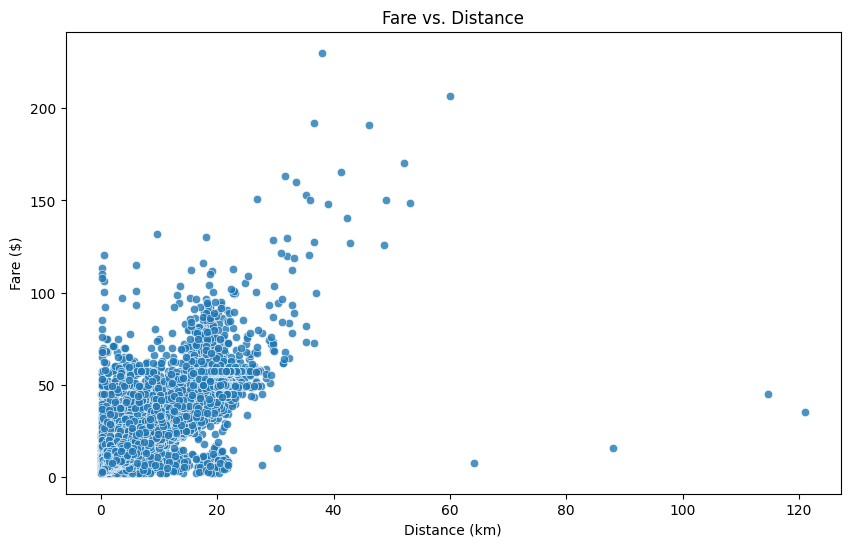

In [ ]:

# 1. Scatter Plot: Fare vs. Distance
plt.figure(figsize=(10, 6))
sns.scatterplot(x='distance_km', y='fare_amount', data=df, alpha=0.8)
plt.title('Fare vs. Distance')
plt.xlabel('Distance (km)')
plt.ylabel('Fare ($)')
plt.show()
#plt.savefig('fare_vs_distance.png')
#plt.close()

In [ ]:
nyc_bounds = {'lon_min': -74.3, 'lon_max': -73.7, 'lat_min': 40.5, 'lat_max': 41.0}
on_of_nyc = df[(
    (df['pickup_longitude'].between(nyc_bounds['lon_min'], nyc_bounds['lon_max'])) &
    (df['pickup_latitude'].between(nyc_bounds['lat_min'], nyc_bounds['lat_max'])) &
    (df['dropoff_longitude'].between(nyc_bounds['lon_min'], nyc_bounds['lon_max'])) &
    (df['dropoff_latitude'].between(nyc_bounds['lat_min'], nyc_bounds['lat_max'])))
]
out_of_nyc = df[~(
    (df['pickup_longitude'].between(nyc_bounds['lon_min'], nyc_bounds['lon_max'])) &
    (df['pickup_latitude'].between(nyc_bounds['lat_min'], nyc_bounds['lat_max'])) &
    (df['dropoff_longitude'].between(nyc_bounds['lon_min'], nyc_bounds['lon_max'])) &
    (df['dropoff_latitude'].between(nyc_bounds['lat_min'], nyc_bounds['lat_max'])))
]

,fare_amount
count,191767.000000
mean,11.173586
std,9.198649
min,2.500000
25%,6.000000
50%,8.500000
75%,12.500000
max,150.830000


<Axes: xlabel='fare_amount', ylabel='Count'>

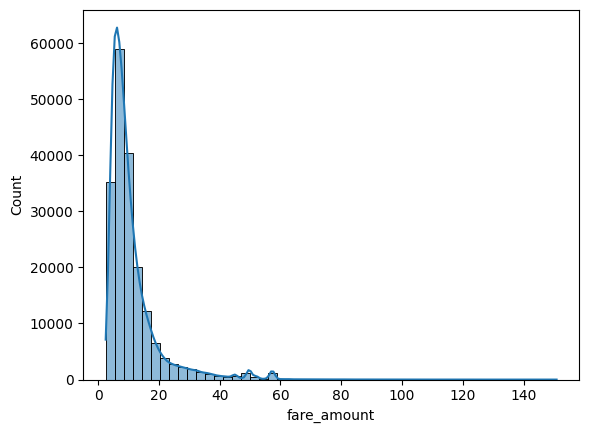

In [ ]:
display(on_of_nyc['fare_amount'].describe())
sns.histplot(on_of_nyc['fare_amount'], bins=50, kde=True)

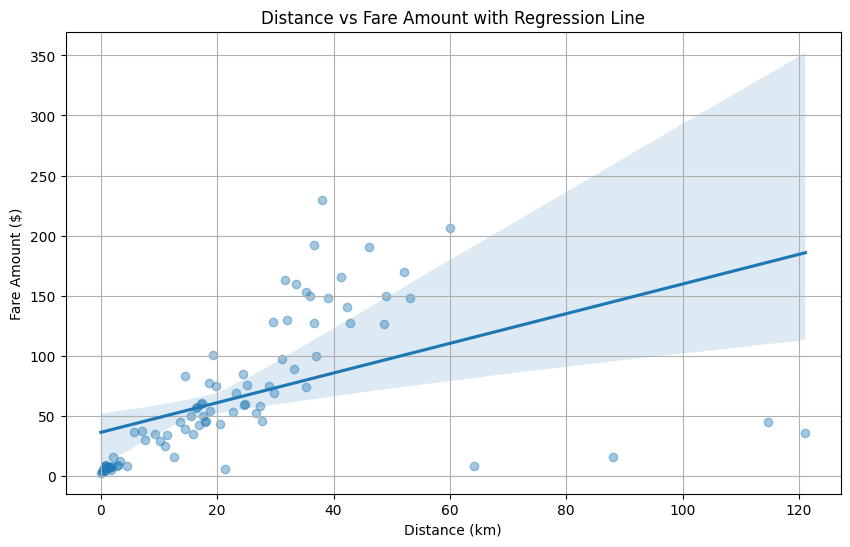

In [ ]:
plt.figure(figsize=(10, 6))
sns.regplot(data=out_of_nyc, x='distance_km', y='fare_amount', scatter_kws={'alpha':0.4})

plt.title('Distance vs Fare Amount with Regression Line')
plt.xlabel('Distance (km)')
plt.ylabel('Fare Amount ($)')
plt.grid(True)
plt.show()

,fare_amount
count,85.000000
mean,65.595294
std,57.572892
min,2.500000
25%,15.300000
50%,50.000000
75%,96.830000
max,230.000000


<Axes: xlabel='fare_amount', ylabel='Count'>

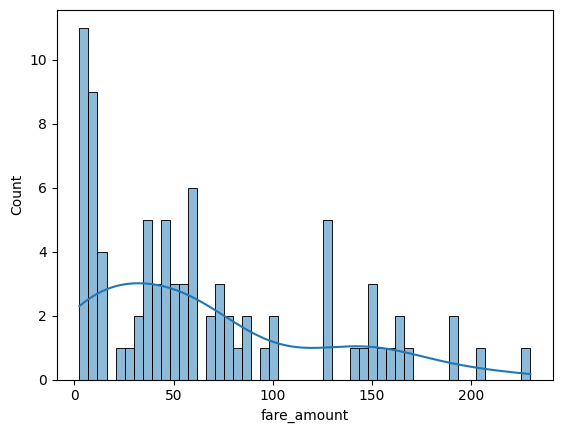

In [ ]:
display(out_of_nyc['fare_amount'].describe())
sns.histplot(out_of_nyc['fare_amount'], bins=50, kde=True)

small distances but have small fare as well

In [ ]:
# distase rthat is near to zero
df[(df['distance_km'] < 0.1)]

,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,minute,pickup_dayofweek,pickup_month,pickup_year,is_weekend,time_period,distance_km,manhattan_distance_km,bearing,suspected_coordinate
2384,2.5,2009-12-09 15:30:39+00:00,-73.810164,40.691844,-73.810166,40.691835,1,15,30,2,12,2009,0,Afternoon,0.001015,0.001167,189.564213,True
3370,2.9,2009-06-16 17:03:04+00:00,-73.978303,40.752325,-73.978992,40.752631,1,17,3,1,6,2009,0,Evening,0.067276,0.091902,300.382089,False
3579,2.9,2011-01-14 20:10:00+00:00,-73.994732,40.738455,-73.995375,40.738937,1,20,10,4,1,2011,0,Evening,0.076206,0.107581,314.692978,False
3616,2.5,2010-01-17 00:01:00+00:00,-73.994690,40.721407,-73.994575,40.721355,1,0,1,6,1,2010,1,Night,0.011285,0.015446,120.821167,False
3627,3.0,2014-06-29 03:37:45+00:00,-73.971632,40.762755,-73.971222,40.762588,1,3,37,6,6,2014,1,Night,0.039207,0.053007,118.269838,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190556,2.5,2015-04-22 09:04:26+00:00,-73.978180,40.751961,-73.977692,40.752396,1,9,4,2,4,2015,0,Morning,0.063482,0.089329,40.383379,False
190740,2.5,2013-06-17 19:58:36+00:00,-73.985790,40.730906,-73.985791,40.730906,1,19,58,0,6,2013,0,Evening,0.000084,0.000084,270.000000,False
191034,2.5,2013-11-09 23:56:00+00:00,-73.788350,40.642015,-73.788327,40.641850,3,23,56,5,11,2013,1,Night,0.018450,0.020252,173.962187,True
191509,2.5,2013-01-08 06:37:00+00:00,-73.928475,40.746455,-73.928463,40.746470,6,6,37,1,1,2013,0,Morning,0.001950,0.002674,31.219389,True


In [ ]:
# Group by fare_amount and collect unique distances
fare_with_distances = (
    df
    .groupby('fare_amount')['distance_km']
    .unique()
    .reset_index()
    .rename(columns={'distance_km': 'possible_distances'})
)

display(fare_with_distances)

,fare_amount,possible_distances
0,2.50,"[0.0010148622991709, 0.0112852995785083, 0.007..."
1,2.90,"[0.3023112495565748, 0.3055576347165925, 0.129..."
2,3.00,"[0.2825599378027148, 0.5145146003650922, 0.419..."
3,3.30,"[0.3022521108558365, 0.3851992400170144, 0.705..."
4,3.40,"[0.3621134344501733, 0.1530969215931412, 0.497..."
...,...,...
1128,170.00,[52.10829058645745]
1129,190.83,[46.08623294740974]
1130,191.80,[36.70334932853168]
1131,206.38,[60.100972350041104]


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


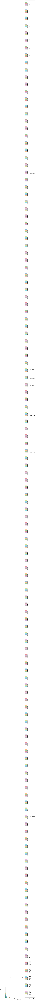

In [ ]:

# Create a new DataFrame where each fare_amount is associated with its distances
expanded_fare_distances = fare_with_distances.explode('possible_distances')

# Plot distribution of possible distances for each fare_amount
plt.figure(figsize=(10, 6))
for fare in expanded_fare_distances['fare_amount'].unique():
    subset = expanded_fare_distances[expanded_fare_distances['fare_amount'] == fare]
    plt.hist(subset['possible_distances'], bins=20, alpha=0.5, label=f"Fare: {fare}")

plt.title('Distribution of Possible Distances for Different Fare Amounts')
plt.xlabel('Distance (km)')
plt.ylabel('Frequency')
plt.legend()
plt.show()


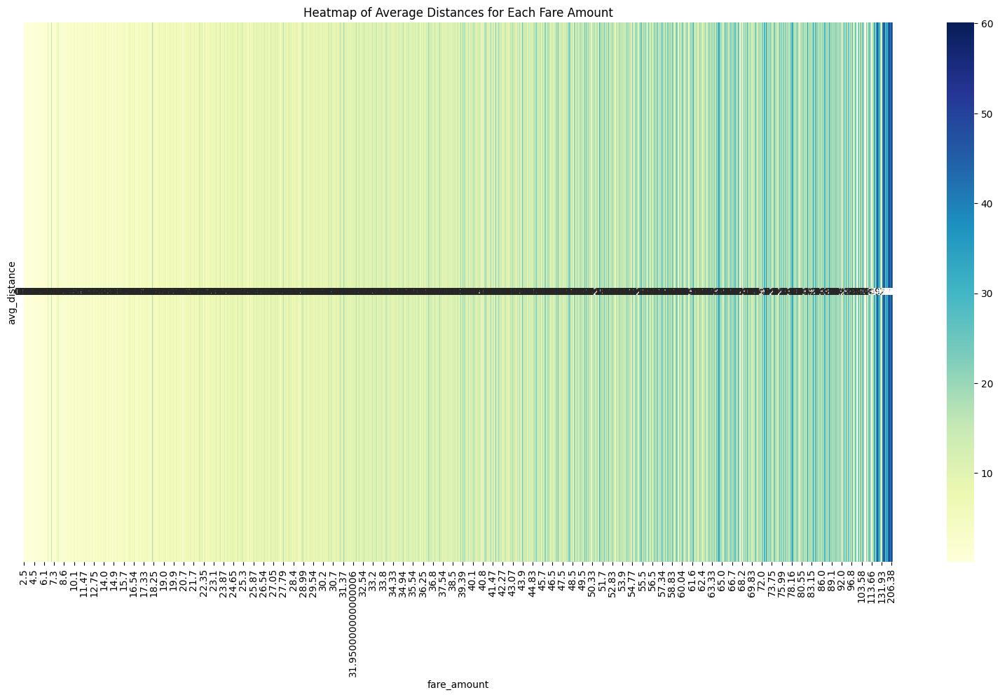

In [ ]:
# Calculate average distance for each fare amount
average_distances = fare_with_distances.copy()
average_distances['avg_distance'] = average_distances['possible_distances'].apply(np.mean)

# Plot heatmap
import seaborn as sns
plt.figure(figsize=(20, 10))
sns.heatmap(average_distances[['fare_amount', 'avg_distance']].set_index('fare_amount').T, annot=True, cmap="YlGnBu")
plt.title('Heatmap of Average Distances for Each Fare Amount')
plt.show()


In [ ]:
average_distances[['fare_amount','avg_distance']]

,fare_amount,avg_distance
0,2.50,0.661741
1,2.90,0.367001
2,3.00,0.472100
3,3.30,0.603686
4,3.40,0.319781
...,...,...
1128,170.00,52.108291
1129,190.83,46.086233
1130,191.80,36.703349
1131,206.38,60.100972


from matplotlib import pyplot as plt
_df_0['fare_amount'].plot(kind='hist', bins=20, title='fare_amount')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['avg_distance'].plot(kind='hist', bins=20, title='avg_distance')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2.plot(kind='scatter', x='fare_amount', y='avg_distance', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['fare_amount']
  ys = series['avg_distance']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_3.sort_values('fare_amount', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('fare_amount')
_ = plt.ylabel('avg_distance')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['fare_amount']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'fare_amount'}, axis=1)
              .sort_values('fare_amount', ascending=True))
  xs = counted['fare_amount']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_4.sort_values('fare_amount', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('fare_amount')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_5['fare_amount'].plot(kind='line', figsize=(8, 4), title='fare_amount')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_6['avg_distance'].plot(kind='line', figsize=(8, 4), title='avg_distance')
plt.gca().spines[['top', 'right']].set_visible(False)

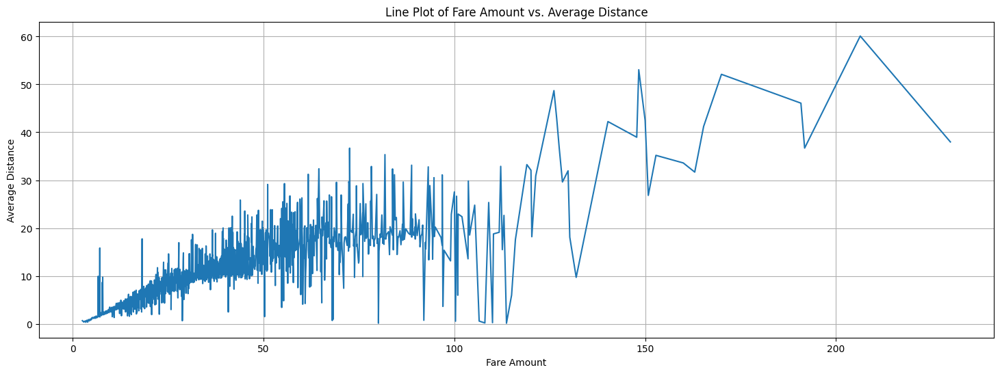

In [ ]:

plt.figure(figsize=(18, 6))
plt.plot(average_distances['fare_amount'], average_distances['avg_distance'])
plt.xlabel('Fare Amount')
plt.ylabel('Average Distance')
plt.title('Line Plot of Fare Amount vs. Average Distance')
plt.grid(True)
plt.show()


In [ ]:
fare_with_distances[fare_with_distances['fare_amount'] < 52]

,fare_amount,possible_distances
0,2.50,"[0.0010148622991709, 0.0112852995785083, 0.007..."
1,2.90,"[0.3023112495565748, 0.3055576347165925, 0.129..."
2,3.00,"[0.2825599378027148, 0.5145146003650922, 0.419..."
3,3.30,"[0.3022521108558365, 0.3851992400170144, 0.705..."
4,3.40,"[0.3621134344501733, 0.1530969215931412, 0.497..."
...,...,...
754,51.70,"[9.9098321924719, 18.21995457625788]"
755,51.80,[20.445271443667195]
756,51.83,"[13.528696352936196, 20.918552827598, 11.19163..."
757,51.87,[23.84723067689982]


Text(0.5, 1.0, 'distance_km Boxplot')

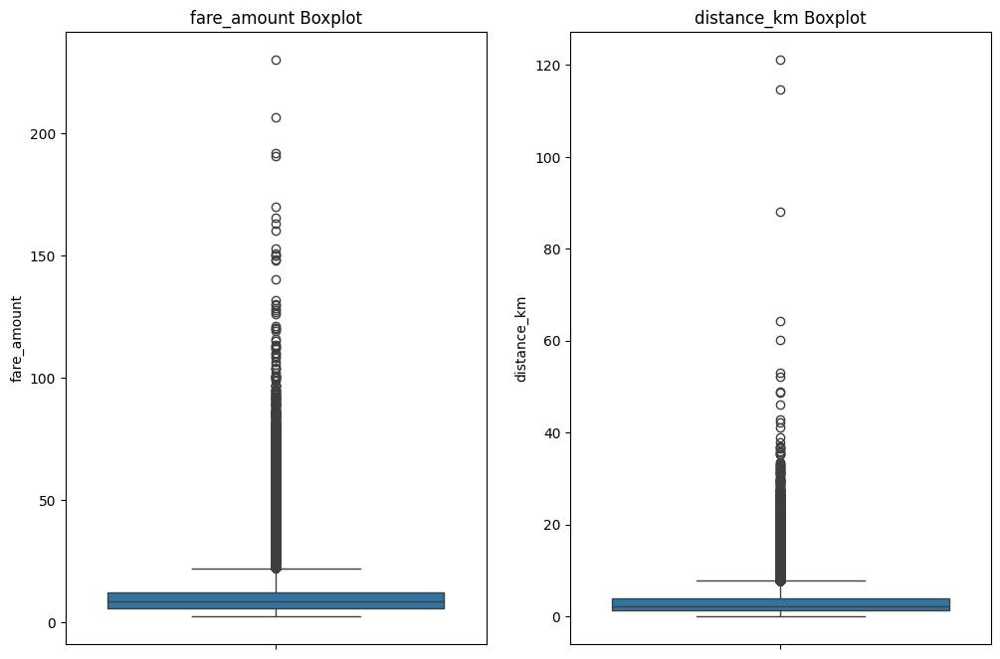

In [ ]:
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
sns.boxplot(y=df['fare_amount'])
plt.title('fare_amount Boxplot')

plt.subplot(1, 2, 2)
sns.boxplot(y=df['distance_km'])
plt.title('distance_km Boxplot')

Distance Analysis
- What is the average trip distance?
- How often do very short/very long trips happen?
- Is manhattan_distance close to real distance?

Text(0.5, 1.0, 'Trip Distance Distribution')

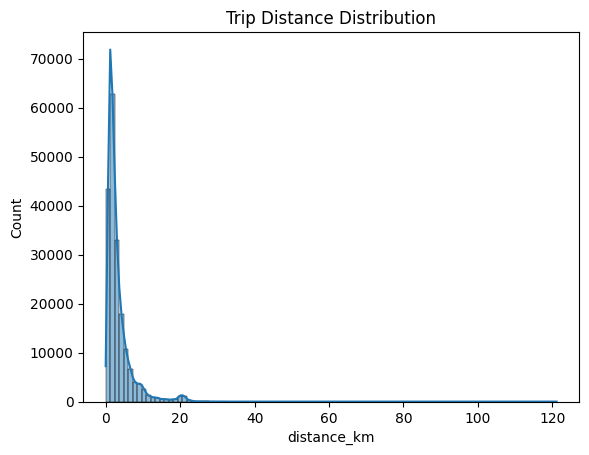

In [ ]:
# 6. What are the most common trip distances?

sns.histplot(df['distance_km'], bins=100, kde=True)
plt.title("Trip Distance Distribution")

In [ ]:
df['distance_km'].describe()

,distance_km
count,191852.000000
mean,3.326297
std,3.569020
min,0.000084
25%,1.285377
50%,2.177580
75%,3.909508
max,121.133668


,distance_km,manhattan_distance_km
distance_km,1.000000,0.992965
manhattan_distance_km,0.992965,1.000000


<Axes: xlabel='manhattan_distance_km', ylabel='distance_km'>

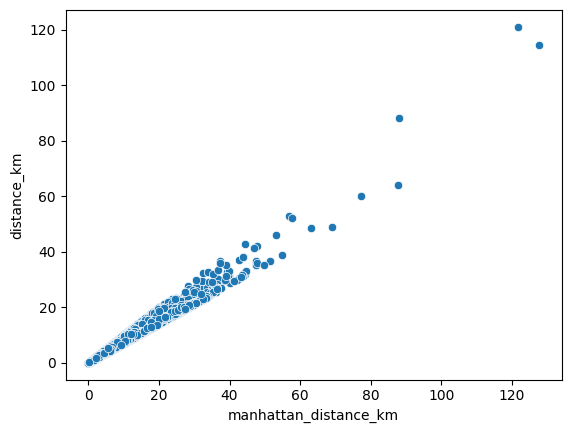

In [ ]:
display(df[['distance_km', 'manhattan_distance_km']].corr())
sns.scatterplot(x='manhattan_distance_km', y='distance_km', data=df)


In [ ]:
# 2 to be answered
# very short <= 20 km
# very long > 20
short_trips = df[df['distance_km'] <= 40]
medium_trips = df[(df['distance_km'] < 80) & (df['distance_km'] > 40)]
long_trips = df[df['distance_km'] > 80]

short_per = len(short_trips)
medium_per = len(medium_trips)
long_per = len(long_trips)
short_per ,medium_per , long_per

(191839, 10, 3)

In [ ]:
df['distance_km'].describe()

,distance_km
count,191852.000000
mean,3.326297
std,3.569020
min,0.000084
25%,1.285377
50%,2.177580
75%,3.909508
max,121.133668


In [118]:
# prompt: add column that classifies trips based on distances like this and gets average fare per class	Very Short trips: 190,668 trips, average fare: $10.77.
# o	Short trips: 2,336 trips, average fare: $53.15.
# o	Medium trips: 10 trips, average fare: $143.21.
# o	Long trips: 3 trips, average fare: $32.00.

# Define distance thresholds for trip classification
distance_thresholds = {
    'Very Short': 2,
    'Short': 40,
    'Medium': 80
}

def classify_trip(distance):
    if distance <= distance_thresholds['Very Short']:
        return 'Very Short'
    elif distance <= distance_thresholds['Short']:
        return 'Short'
    elif distance <= distance_thresholds['Medium']:
        return 'Medium'
    else:
        return 'Long'

# Apply the classification function to create a new 'Trip Class' column
df['Trip Class'] = df['distance_km'].apply(classify_trip)

# Calculate the average fare for each trip class
average_fares_by_class = df.groupby('Trip Class')['fare_amount'].mean()

# Print the results
for trip_class, avg_fare in average_fares_by_class.items():
    print(f"o\t{trip_class} trips: {df[df['Trip Class']==trip_class].shape[0]} trips, average fare: ${avg_fare:.2f}.")


o	Long trips: 3 trips, average fare: $32.00.
o	Medium trips: 10 trips, average fare: $143.20.
o	Short trips: 104054 trips, average fare: $15.30.
o	Very Short trips: 87785 trips, average fare: $6.32.


In [120]:
df['Trip Class'].value_counts()

,count
Trip Class,
Short,104054
Very Short,87785
Medium,10
Long,3


Passenger Count
- What is the most common passenger count?
- How does fare vary by passenger count?

,count
passenger_count,
1,132735
2,28265
5,13407
3,8543
6,4117
4,4105
0,680


<Axes: xlabel='passenger_count', ylabel='count'>

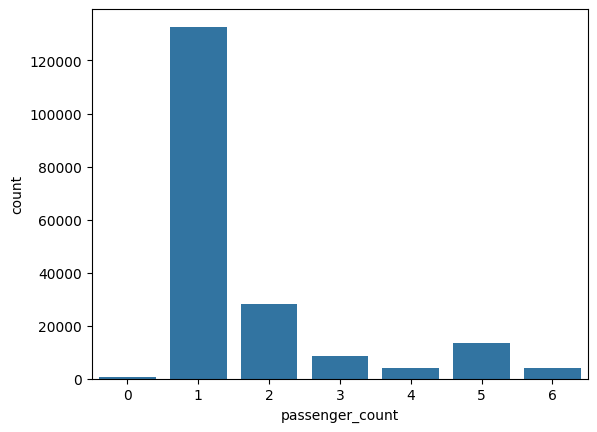

In [ ]:
display(df['passenger_count'].value_counts())
sns.countplot(x='passenger_count', data=df)


<ipython-input-53-7faf65224e53>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_fare_per_passenger, x='passenger_count', y='fare_amount', palette='Blues')


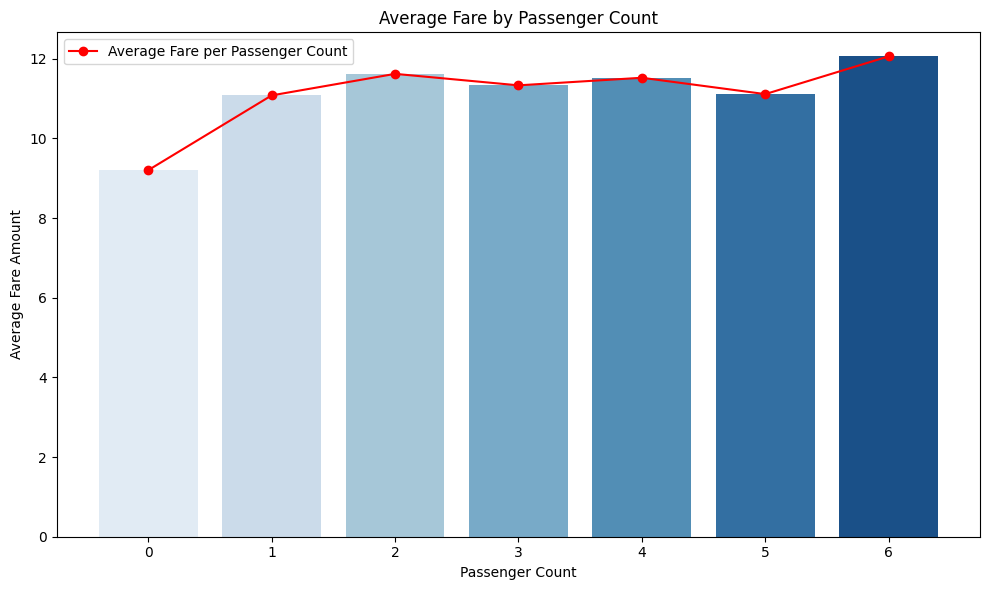

In [ ]:
# 7. Does passenger count affect fare?

# Calculate average fare per passenger count
avg_fare_per_passenger = df.groupby('passenger_count')['fare_amount'].mean().reset_index()

# Sort values by 'passenger_count' to ensure the line progresses smoothly
avg_fare_per_passenger = avg_fare_per_passenger.sort_values('passenger_count')

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=avg_fare_per_passenger, x='passenger_count', y='fare_amount', palette='Blues')

# Add a line plot for the average fare values of each passenger count
plt.plot(avg_fare_per_passenger['passenger_count'], avg_fare_per_passenger['fare_amount'],
         color='red', marker='o', linestyle='-', label='Average Fare per Passenger Count')

# Title and labels
plt.title('Average Fare by Passenger Count')
plt.xlabel('Passenger Count')
plt.ylabel('Average Fare Amount')
plt.legend()  # To display the label for the line

plt.tight_layout()
plt.show()

Temporal Analysis
- What hours are most popular for pickups?
- Which days of the week/months are busiest?
- Does fare differ on weekends vs weekdays?

In [ ]:
df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'])
df['date'] = df['pickup_datetime'].dt.date  # useful for daily trends


<Axes: title={'center': 'Daily Rides Over Time'}, xlabel='date'>

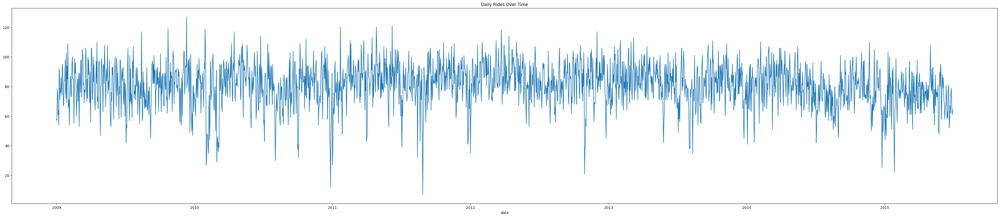

In [ ]:
df['date'].value_counts().sort_index().plot(figsize=(50, 10), title='Daily Rides Over Time')


<Axes: title={'center': 'Total Daily Revenue'}, xlabel='date'>

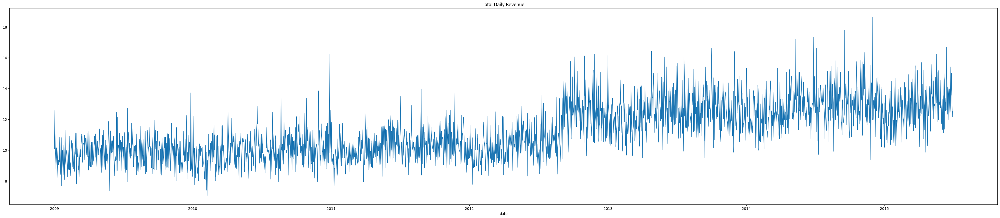

In [ ]:
daily_revenue = df.groupby('date')['fare_amount'].mean()
daily_revenue.plot(figsize=(50, 10), title='Total Daily Revenue')


<ipython-input-124-1608b15575c6>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='pickup_year', data=df, palette='viridis', order=year_counts['pickup_year'])


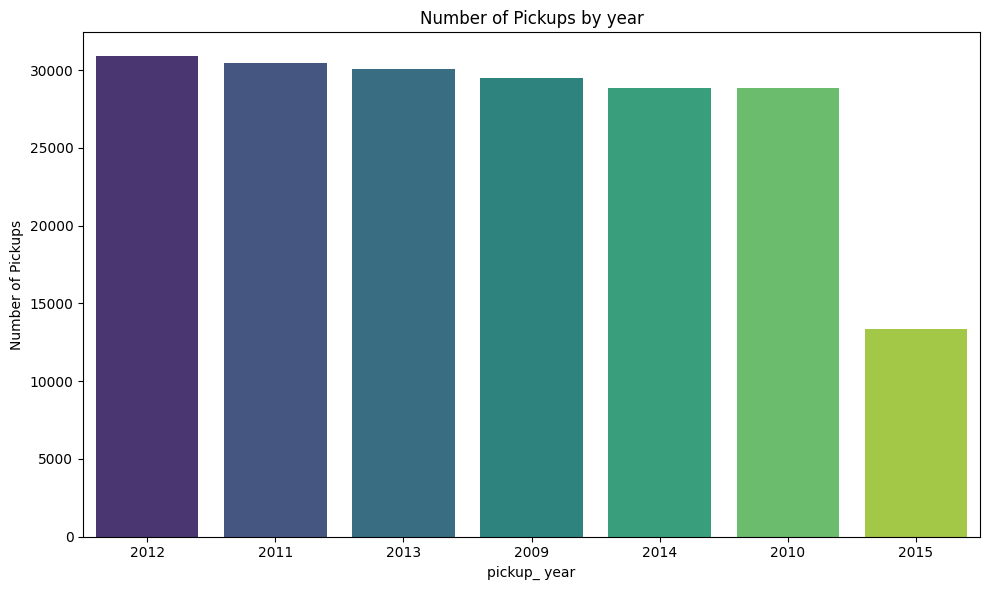

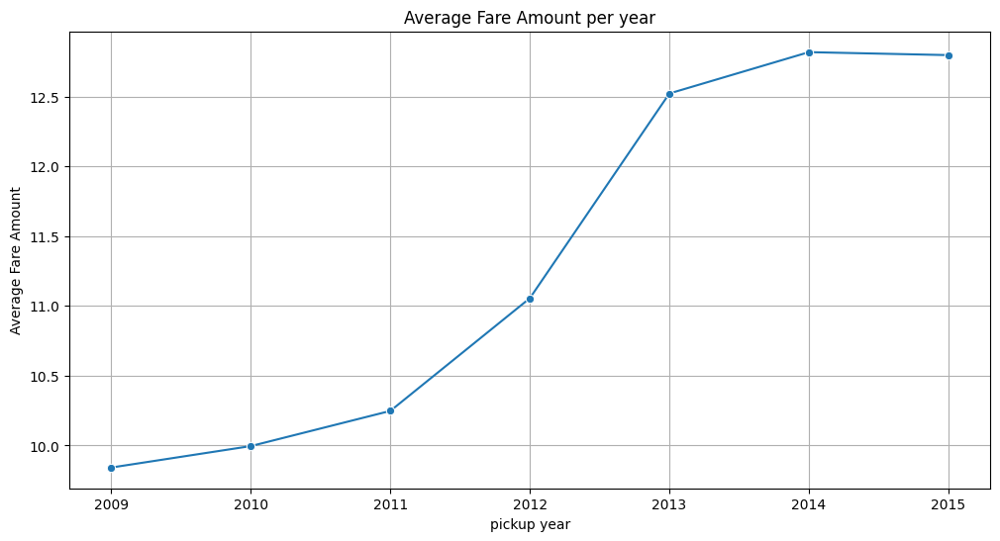

In [124]:
# Count the number of pickups per hour
year_counts = df['pickup_year'].value_counts().reset_index()
year_counts.columns = ['pickup_year', 'count']

# Sort by the count in descending order
year_counts = year_counts.sort_values(by='count', ascending=False)

# Plot with sorted values and custom color palette
plt.figure(figsize=(10, 6))
sns.countplot(x='pickup_year', data=df, palette='viridis', order=year_counts['pickup_year'])
plt.title("Number of Pickups by year")
plt.xlabel("pickup_ year")
plt.ylabel("Number of Pickups")
plt.tight_layout()
plt.show()


# Calculate average fare per hour
average_fare_per_yaer = df.groupby('pickup_year')['fare_amount'].mean().reset_index()

# Create the plot
plt.figure(figsize=(12, 6))
sns.lineplot(x='pickup_year', y='fare_amount', data=average_fare_per_yaer, marker='o')
plt.title('Average Fare Amount per year')
plt.xlabel('pickup year')
plt.ylabel('Average Fare Amount')
plt.grid(True)
plt.show()

<ipython-input-126-e0795d6dafc2>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='month_name', y='count', data=month_counts, palette='viridis', order=month_counts['month_name'])


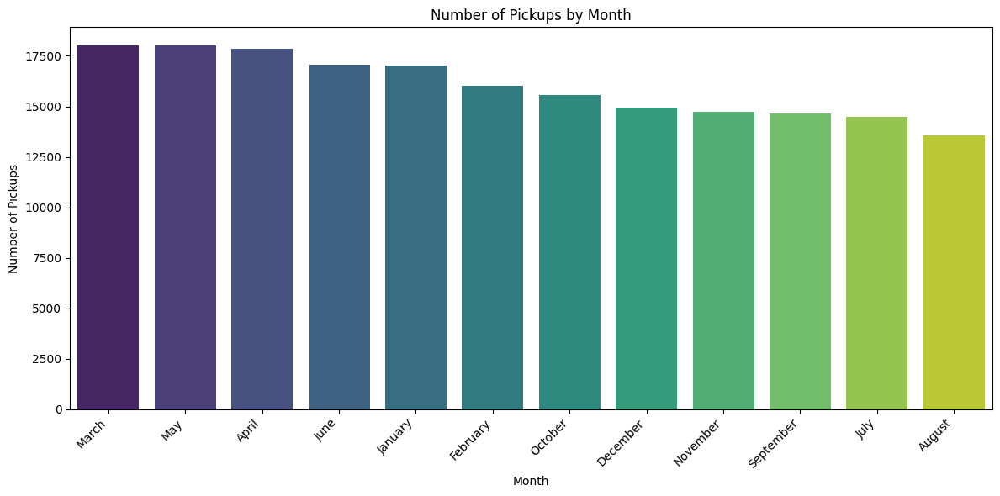

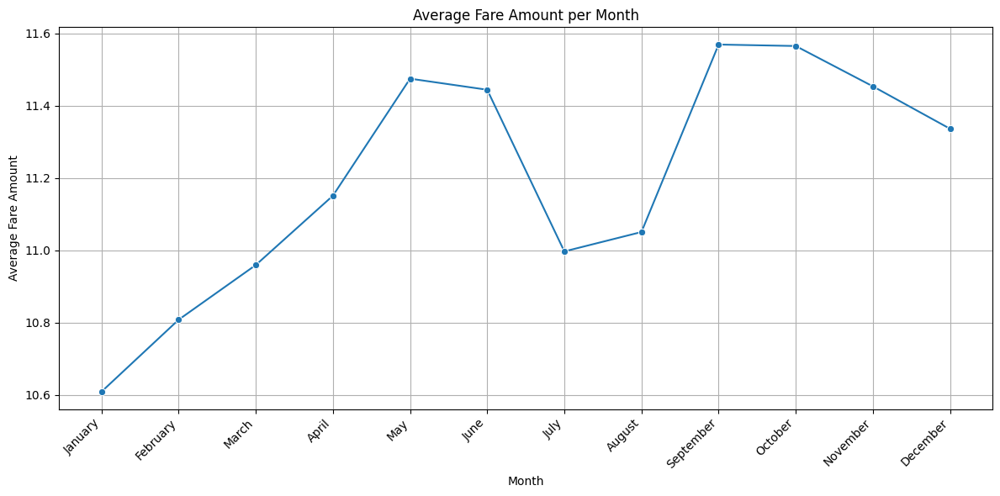

In [126]:

# Count the number of pickups per month
month_counts = df['pickup_month'].value_counts().reset_index()
month_counts.columns = ['pickup_month', 'count']

# Sort by the count in descending order
month_counts = month_counts.sort_values(by='count', ascending=False)

# Create a dictionary to map month numbers to month names
month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 6: 'June',
    7: 'July', 8: 'August', 9: 'September', 10: 'October', 11: 'November', 12: 'December'
}

# Map month numbers to month names in the plot
month_counts['month_name'] = month_counts['pickup_month'].map(month_names)


# Plot with sorted values and custom color palette
plt.figure(figsize=(12, 6))
sns.barplot(x='month_name', y='count', data=month_counts, palette='viridis', order=month_counts['month_name'])
plt.title("Number of Pickups by Month")
plt.xlabel("Month")
plt.ylabel("Number of Pickups")
plt.xticks(rotation=45, ha='right') # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

# Calculate average fare per month
average_fare_per_month = df.groupby('pickup_month')['fare_amount'].mean().reset_index()

# Map month numbers to month names
average_fare_per_month['month_name'] = average_fare_per_month['pickup_month'].map(month_names)

# Sort by month number to maintain chronological order
average_fare_per_month = average_fare_per_month.sort_values('pickup_month')


# Create the plot
plt.figure(figsize=(12, 6))
sns.lineplot(x='month_name', y='fare_amount', data=average_fare_per_month, marker='o')
plt.title('Average Fare Amount per Month')
plt.xlabel('Month')
plt.ylabel('Average Fare Amount')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.tight_layout() # Adjust layout to prevent labels from overlapping
plt.show()


trips by hour/day/weekend/time_period

<ipython-input-64-c584b89daa07>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='hour', data=df, palette='viridis', order=hour_counts['hour'])


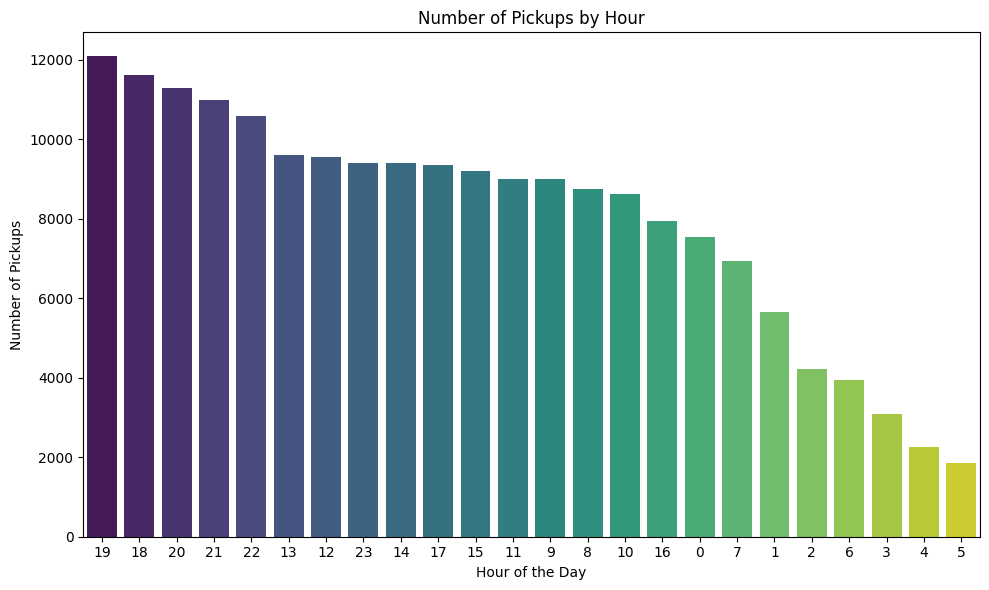

In [ ]:
# 3. What are the busiest hours for pickups?
# Count the number of pickups per hour
hour_counts = df['hour'].value_counts().reset_index()
hour_counts.columns = ['hour', 'count']

# Sort by the count in descending order
hour_counts = hour_counts.sort_values(by='count', ascending=False)

# Plot with sorted values and custom color palette
plt.figure(figsize=(10, 6))
sns.countplot(x='hour', data=df, palette='viridis', order=hour_counts['hour'])
plt.title("Number of Pickups by Hour")
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Pickups")
plt.tight_layout()
plt.show()

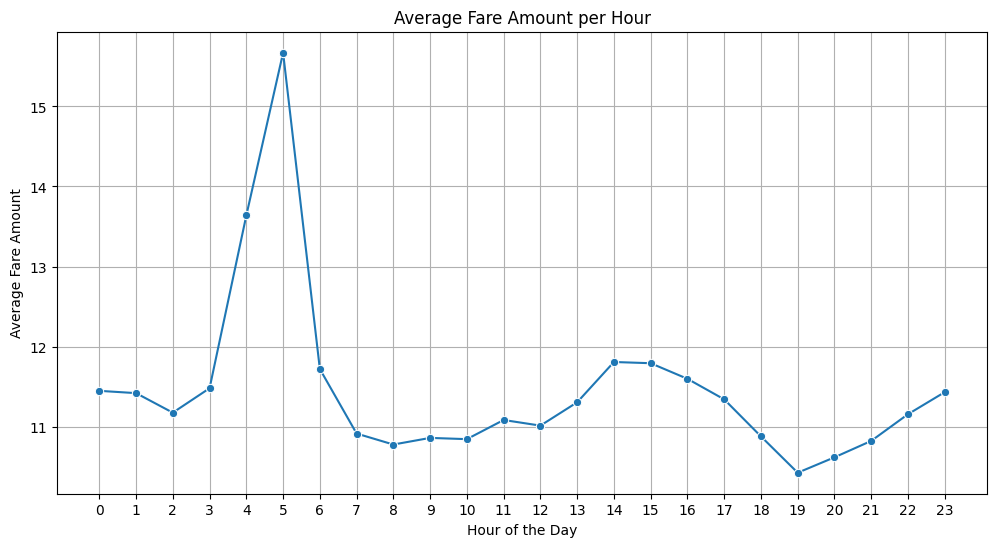

In [ ]:

# Calculate average fare per hour
average_fare_per_hour = df.groupby('hour')['fare_amount'].mean().reset_index()

# Create the plot
plt.figure(figsize=(12, 6))
sns.lineplot(x='hour', y='fare_amount', data=average_fare_per_hour, marker='o')
plt.title('Average Fare Amount per Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Fare Amount')
plt.xticks(range(24))  # Ensure all hours are displayed on the x-axis
plt.grid(True)
plt.show()


<ipython-input-69-6071559b2fc5>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='time_period', data=df, palette='viridis', order=time_counts['time_period'])


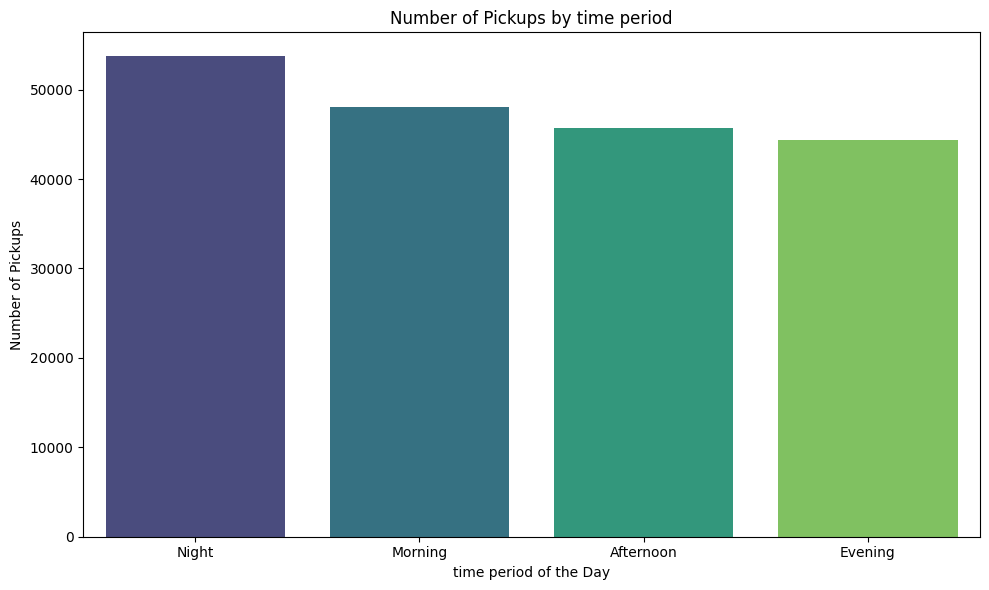

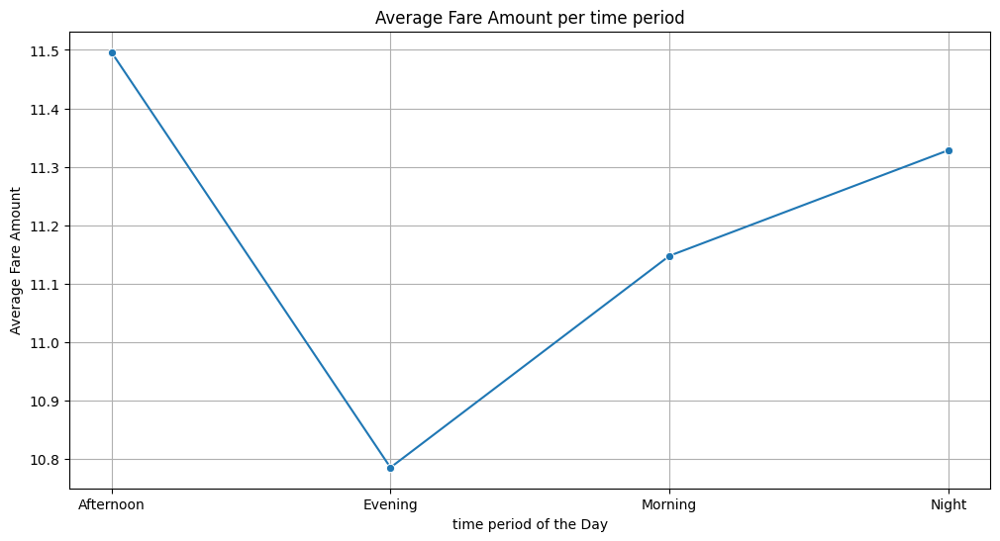

In [ ]:
#5. How does demand vary by time of day?

# Count the number of pickups per hour
time_counts = df['time_period'].value_counts().reset_index()
time_counts.columns = ['time_period', 'count']

# Sort by the count in descending order
time_counts = time_counts.sort_values(by='count', ascending=False)

# Plot with sorted values and custom color palette
plt.figure(figsize=(10, 6))
sns.countplot(x='time_period', data=df, palette='viridis', order=time_counts['time_period'])
plt.title("Number of Pickups by time period")
plt.xlabel("time period of the Day")
plt.ylabel("Number of Pickups")
plt.tight_layout()
plt.show()

# Calculate average fare per time_period
average_fare_per_time = df.groupby('time_period')['fare_amount'].mean().reset_index()

# plot results
plt.figure(figsize=(12, 6))
sns.lineplot(x='time_period', y='fare_amount', data=average_fare_per_time, marker='o')
plt.title('Average Fare Amount per time period')
plt.xlabel('time period of the Day')
plt.ylabel('Average Fare Amount')
plt.grid(True)
plt.show()

,count
is_weekend,
0,137487
1,54365


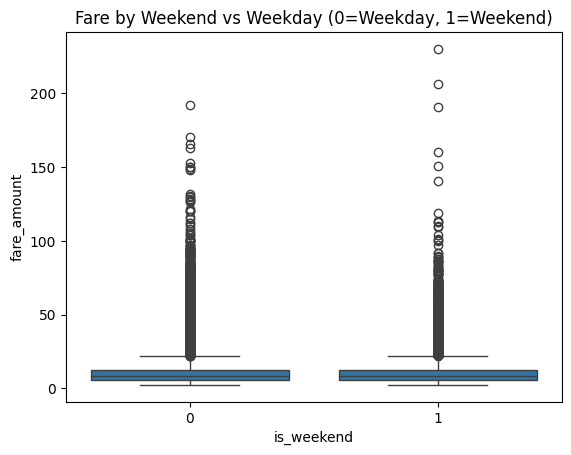

In [ ]:
# 4. How do weekdays/weekends affect demand?
sns.boxplot(x='is_weekend', y='fare_amount', data=df)
plt.title("Fare by Weekend vs Weekday (0=Weekday, 1=Weekend)")

df['is_weekend'].value_counts()


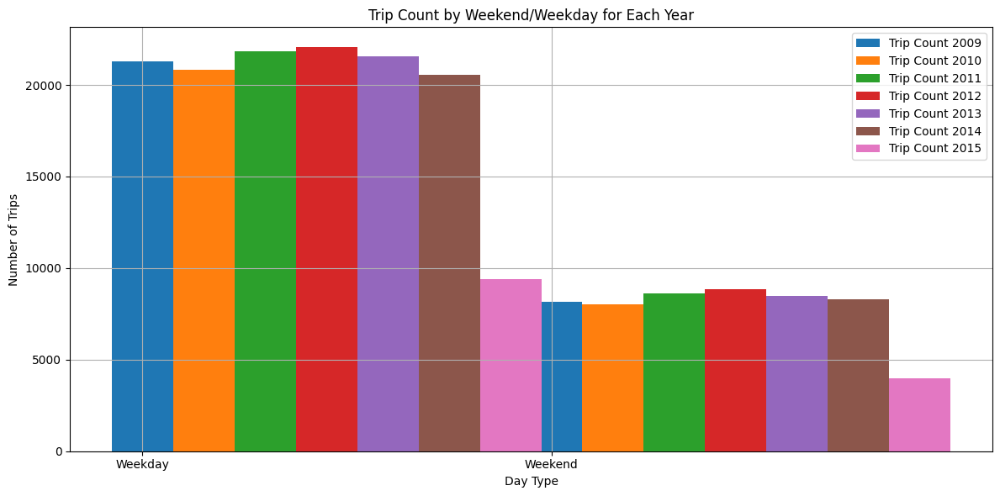

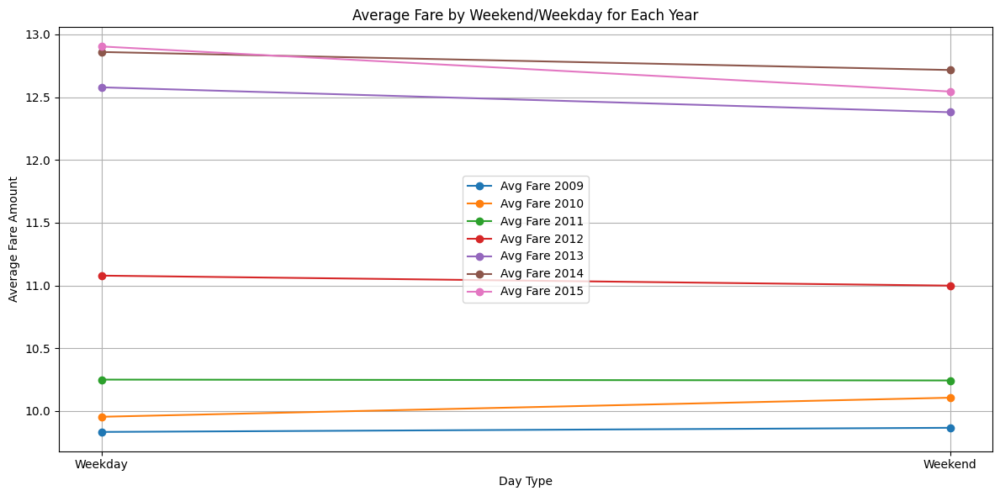

In [ ]:
# Group by year and weekend
weekend_stats = df.groupby(['pickup_year', 'is_weekend']).agg({
    'fare_amount': 'mean',
    'passenger_count': 'count'
}).reset_index().rename(columns={'passenger_count': 'trip_count'})

weekend_map = {0: 'Weekday', 1: 'Weekend'}
years = sorted(df['pickup_year'].unique())

# ------ First plot: Trip Count -------
plt.figure(figsize=(12, 6))

for year in years:
    yearly_data = weekend_stats[weekend_stats['pickup_year'] == year]
    plt.bar(
        [x + (year - years[0])*0.15 for x in yearly_data['is_weekend']],
        yearly_data['trip_count'],
        width=0.15,
        label=f'Trip Count {year}'
    )

plt.xticks([0, 1], ['Weekday', 'Weekend'])
plt.xlabel('Day Type')
plt.ylabel('Number of Trips')
plt.title('Trip Count by Weekend/Weekday for Each Year')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ------ Second plot: Average Fare -------
plt.figure(figsize=(12, 6))

for year in years:
    yearly_data = weekend_stats[weekend_stats['pickup_year'] == year]
    plt.plot(
        yearly_data['is_weekend'],
        yearly_data['fare_amount'],
        marker='o',
        linestyle='-',
        label=f'Avg Fare {year}'
    )

plt.xticks([0, 1], ['Weekday', 'Weekend'])
plt.xlabel('Day Type')
plt.ylabel('Average Fare Amount')
plt.title('Average Fare by Weekend/Weekday for Each Year')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

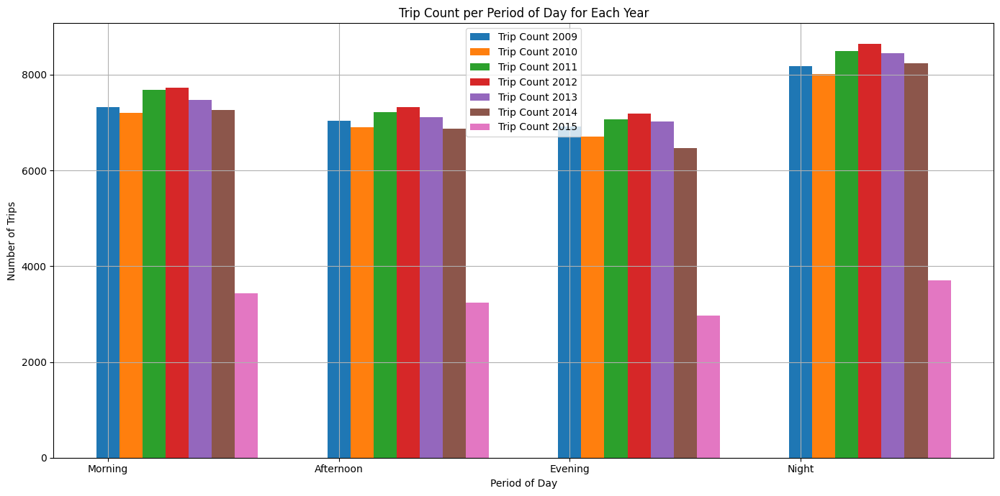

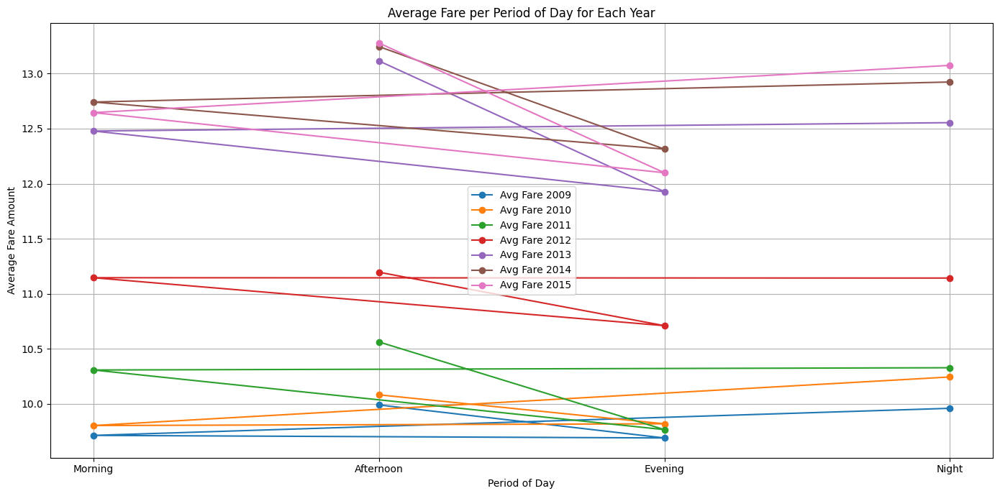

In [ ]:
import matplotlib.pyplot as plt

# Group by year and period
period_stats = df.groupby(['pickup_year', 'time_period']).agg({
    'fare_amount': 'mean',
    'passenger_count': 'count'
}).reset_index().rename(columns={'passenger_count': 'trip_count'})

# Define correct period order
period_order = ['Morning', 'Afternoon', 'Evening', 'Night']
years = sorted(df['pickup_year'].unique())

# ------ First plot: Trip Count -------
plt.figure(figsize=(14, 7))

for year in years:
    yearly_data = period_stats[period_stats['pickup_year'] == year]
    plt.bar(
        [period_order.index(p) + (year - years[0])*0.1 for p in yearly_data['time_period']],
        yearly_data['trip_count'],
        width=0.1,
        label=f'Trip Count {year}'
    )

plt.xticks(range(4), period_order)
plt.xlabel('Period of Day')
plt.ylabel('Number of Trips')
plt.title('Trip Count per Period of Day for Each Year')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ------ Second plot: Average Fare -------
plt.figure(figsize=(14, 7))

for year in years:
    yearly_data = period_stats[period_stats['pickup_year'] == year]
    plt.plot(
        [period_order.index(p) for p in yearly_data['time_period']],
        yearly_data['fare_amount'],
        marker='o',
        linestyle='-',
        label=f'Avg Fare {year}'
    )

plt.xticks(range(4), period_order)
plt.xlabel('Period of Day')
plt.ylabel('Average Fare Amount')
plt.title('Average Fare per Period of Day for Each Year')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


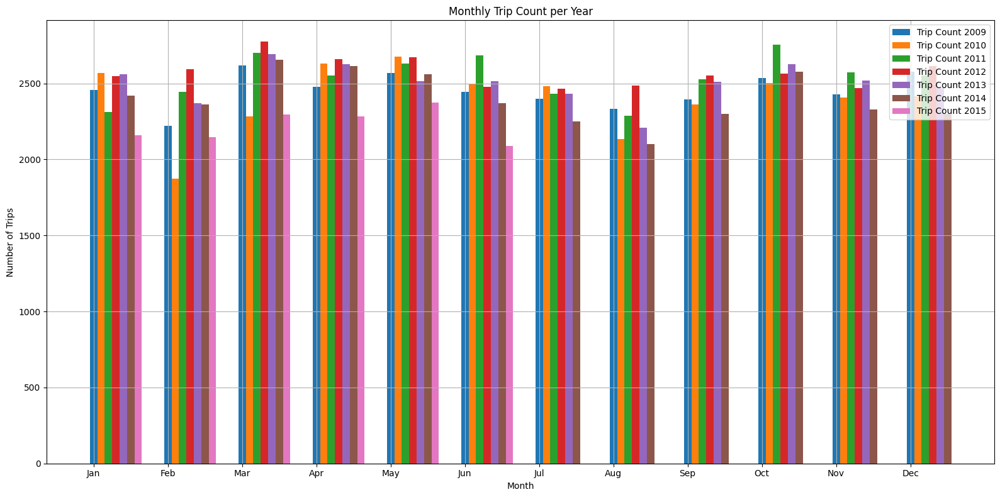

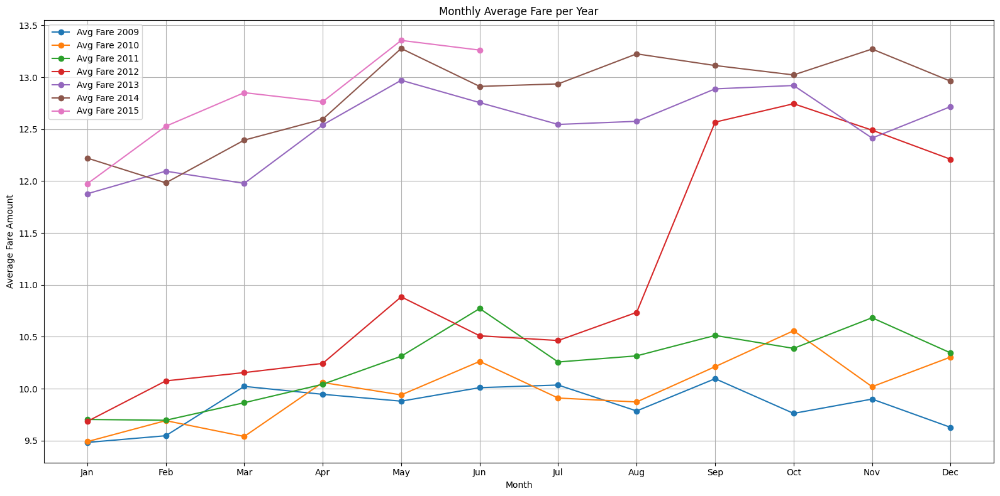

In [ ]:
import matplotlib.pyplot as plt

# Ensure month is numeric if not already
df['pickup_month'] = pd.to_numeric(df['pickup_month'], errors='coerce')

# Group by year and month
month_stats = df.groupby(['pickup_year', 'pickup_month']).agg({
    'fare_amount': 'mean',
    'passenger_count': 'count'
}).reset_index().rename(columns={'passenger_count': 'trip_count'})

# Get years
years = sorted(df['pickup_year'].unique())

# ------ First plot: Trip Count -------
plt.figure(figsize=(16, 8))

for year in years:
    yearly_data = month_stats[month_stats['pickup_year'] == year]
    plt.bar(
        yearly_data['pickup_month'] + (year - years[0])*0.1,  # Shift bars a little
        yearly_data['trip_count'],
        width=0.1,
        label=f'Trip Count {year}'
    )

plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                          'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.xlabel('Month')
plt.ylabel('Number of Trips')
plt.title('Monthly Trip Count per Year')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ------ Second plot: Average Fare -------
plt.figure(figsize=(16, 8))

for year in years:
    yearly_data = month_stats[month_stats['pickup_year'] == year]
    plt.plot(
        yearly_data['pickup_month'],
        yearly_data['fare_amount'],
        marker='o',
        linestyle='-',
        label=f'Avg Fare {year}'
    )

plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                          'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.xlabel('Month')
plt.ylabel('Average Fare Amount')
plt.title('Monthly Average Fare per Year')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


detect overpriced trips and analyze them further.

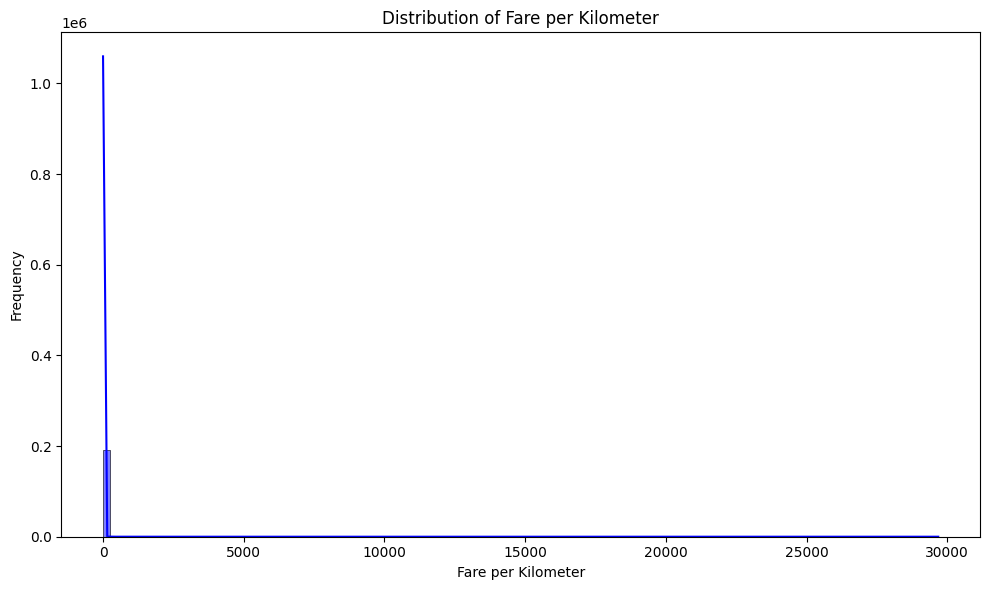

count    191852.000000
mean          7.680413
std         194.995139
min           0.122807
25%           2.973371
50%           3.820709
75%           5.037950
max       29680.171267
Name: fare_per_km, dtype: float64


In [ ]:
# Create a new column fare_per_km
df['fare_per_km'] = df['fare_amount'] / df['distance_km']

# Visualize the distribution of fare_per_km
plt.figure(figsize=(10, 6))
sns.histplot(df['fare_per_km'], kde=True, bins=120, color='blue')
plt.title('Distribution of Fare per Kilometer')
plt.xlabel('Fare per Kilometer')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# Summary statistics to identify potential overpriced trips
print(df['fare_per_km'].describe())


🌍 Geographical Patterns

- Where are the most common pickup/dropoff locations? (heatmaps)
- Which areas contribute most to revenue?
- Which trips are unusually expensive/cheap for the distance?

- Where are pickups and dropoffs most concentrated?
- Are there distance or fare hotspots?
- What are common trip directions (bearings)?


In [ ]:
def classify_bearing(bearing):
    if (bearing >= 337.5 or bearing < 22.5):
        return 'N'
    elif 22.5 <= bearing < 67.5:
        return 'NE'
    elif 67.5 <= bearing < 112.5:
        return 'E'
    elif 112.5 <= bearing < 157.5:
        return 'SE'
    elif 157.5 <= bearing < 202.5:
        return 'S'
    elif 202.5 <= bearing < 247.5:
        return 'SW'
    elif 247.5 <= bearing < 292.5:
        return 'W'
    else:
        return 'NW'

df['bearing_class'] = df['bearing'].apply(classify_bearing)


<ipython-input-89-b3dbb643a1c8>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='bearing_class', data=df, palette='viridis', order=bearing_counts['bearing_class'])


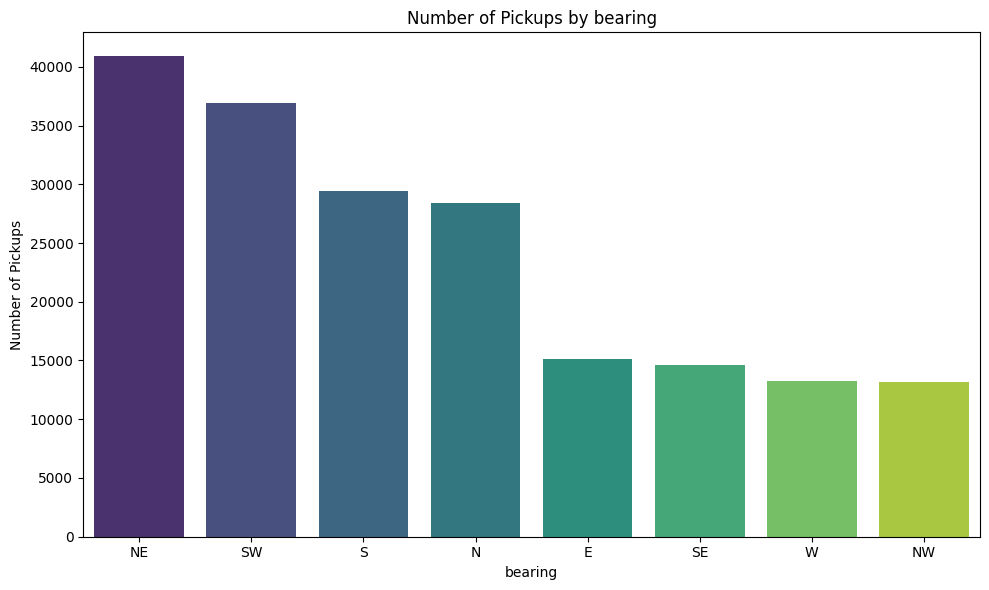

In [89]:

# Count the number of pickups per hour
bearing_counts = df['bearing_class'].value_counts().reset_index()
bearing_counts.columns = ['bearing_class', 'count']

# Sort by the count in descending order
bearing_counts = bearing_counts.sort_values(by='count', ascending=False)

# Plot with sorted values and custom color palette
plt.figure(figsize=(10, 6))
sns.countplot(x='bearing_class', data=df, palette='viridis', order=bearing_counts['bearing_class'])
plt.title("Number of Pickups by bearing")
plt.xlabel("bearing")
plt.ylabel("Number of Pickups")
plt.tight_layout()
plt.show()

bearing_class
W     14.362553
NW    13.886633
E     12.965753
SE    12.894403
S     10.759094
SW    10.283459
N     10.114746
NE     9.941342
Name: fare_amount, dtype: float64


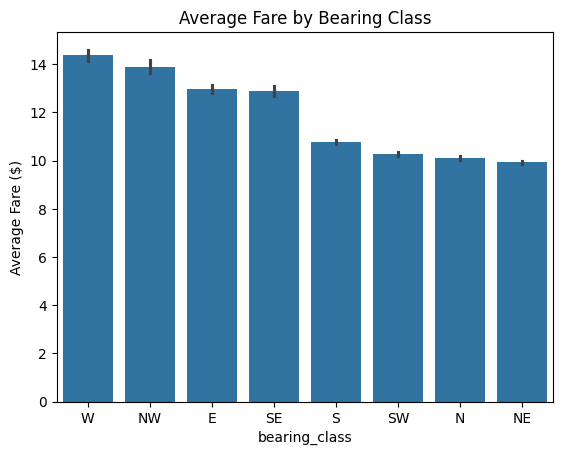

In [98]:
avg_fare = df.groupby('bearing_class')['fare_amount'].mean().sort_values(ascending=False)
print(avg_fare)

# Plot
sns.barplot(x='bearing_class', y='fare_amount', data=df, order=avg_fare.index)
plt.title('Average Fare by Bearing Class')
plt.ylabel('Average Fare ($)')
plt.show()


bearing_class
NW    4.318920
SE    3.856694
W     3.690619
E     3.554851
NE    3.172055
S     3.162451
SW    3.061398
N     3.038576
Name: distance_km, dtype: float64


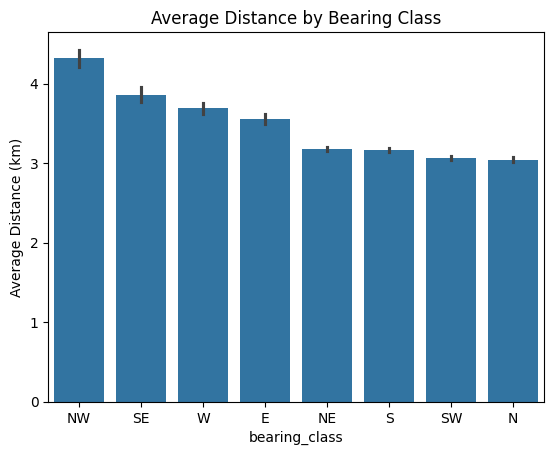

In [97]:
avg_distance = df.groupby('bearing_class')['distance_km'].mean().sort_values(ascending=False)
print(avg_distance)

# Plot
sns.barplot(x='bearing_class', y='distance_km', data=df, order=avg_distance.index)
plt.title('Average Distance by Bearing Class')
plt.ylabel('Average Distance (km)')
plt.show()


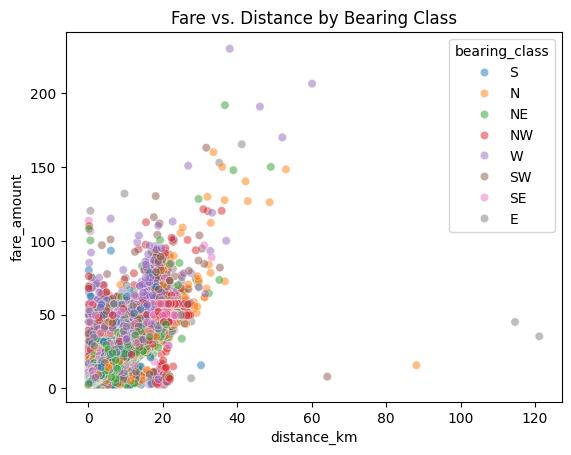

bearing_class             
E              fare_amount    0.859831
N              fare_amount    0.863007
NE             fare_amount    0.855490
NW             fare_amount    0.949044
S              fare_amount    0.872006
SE             fare_amount    0.952417
SW             fare_amount    0.850643
W              fare_amount    0.901141
Name: distance_km, dtype: float64


In [95]:
# Scatter plot: distance vs fare, colored by bearing_class
sns.scatterplot(x='distance_km', y='fare_amount', hue='bearing_class', data=df, alpha=0.5)
plt.title('Fare vs. Distance by Bearing Class')
plt.show()

# Correlation per bearing_class
correlations = df.groupby('bearing_class')[['fare_amount', 'distance_km']].corr().iloc[0::2, -1]
print(correlations)

bearing_class
S      5.803432
NE     6.225703
SW     6.555585
N      6.770996
NW     7.808177
SE    10.668100
W     12.472135
E     12.519570
Name: fare_per_km, dtype: float64


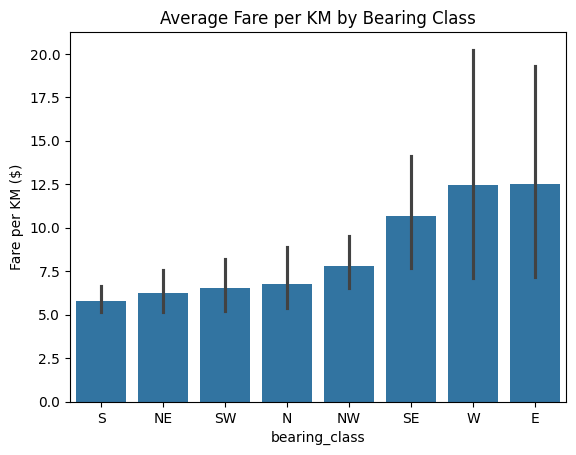

In [93]:
avg_cost_eff = df.groupby('bearing_class')['fare_per_km'].mean().sort_values()
print(avg_cost_eff)

# Plot
sns.barplot(x='bearing_class', y='fare_per_km', data=df, order=avg_cost_eff.index)
plt.title('Average Fare per KM by Bearing Class')
plt.ylabel('Fare per KM ($)')
plt.show()

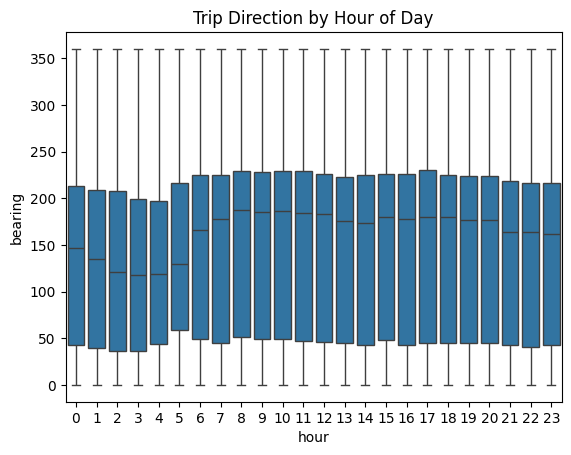

In [99]:
# time analysis
sns.boxplot(x='hour', y='bearing', data=df)
plt.title('Trip Direction by Hour of Day')
plt.show()

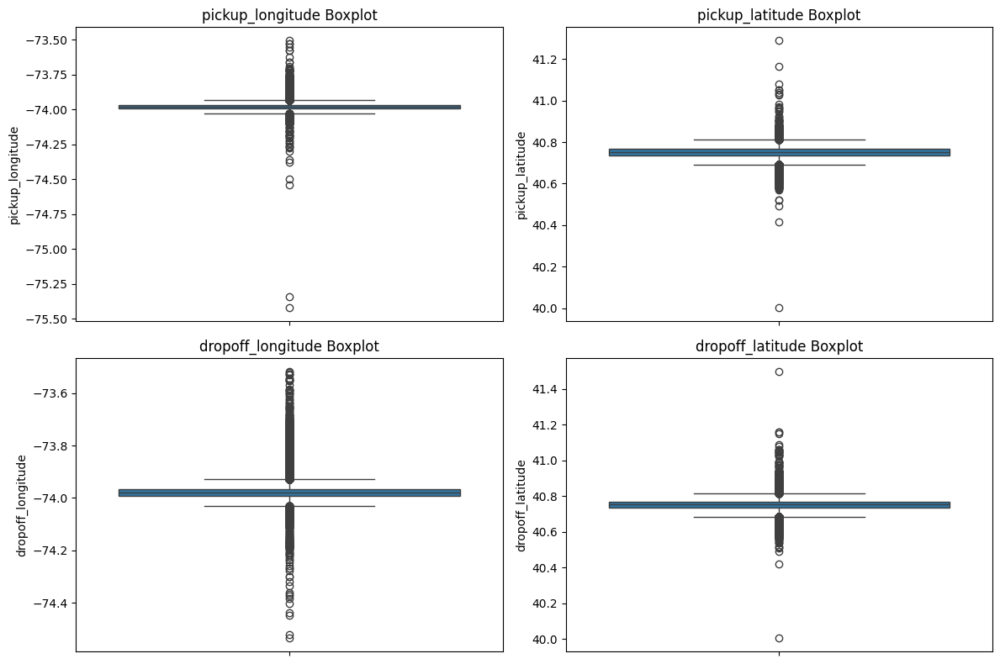

In [ ]:
# draw boxplots for 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude'

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
sns.boxplot(y=df['pickup_longitude'])
plt.title('pickup_longitude Boxplot')

plt.subplot(2, 2, 2)
sns.boxplot(y=df['pickup_latitude'])
plt.title('pickup_latitude Boxplot')

plt.subplot(2, 2, 3)
sns.boxplot(y=df['dropoff_longitude'])
plt.title('dropoff_longitude Boxplot')

plt.subplot(2, 2, 4)
sns.boxplot(y=df['dropoff_latitude'])
plt.title('dropoff_latitude Boxplot')

plt.tight_layout()
plt.show()



In [ ]:
import folium
from folium.plugins import HeatMap

map_ = folium.Map(location=[40.75, -73.98], zoom_start=12)
heat_data = df[['pickup_latitude', 'pickup_longitude']].dropna().values.tolist()
heat_data2 = df[['dropoff_latitude', 'dropoff_longitude']].dropna().values.tolist()
HeatMap(heat_data[:]).add_to(map_)
HeatMap(heat_data2[:]).add_to(map_)

map_

In [ ]:
df['pickup_latitude'].round(2).nunique() , df['pickup_longitude'].round(2).nunique() , df['dropoff_latitude'].round(2).nunique(), df['dropoff_longitude'].round(2).nunique()


(52, 70, 61, 86)

<ipython-input-76-14cf525168b5>:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=out_of_nyc['pickup_longitude'], y=out_of_nyc['pickup_latitude'], cmap="Reds", shade=True, bw_adjust=.5)


<Axes: xlabel='pickup_longitude', ylabel='pickup_latitude'>

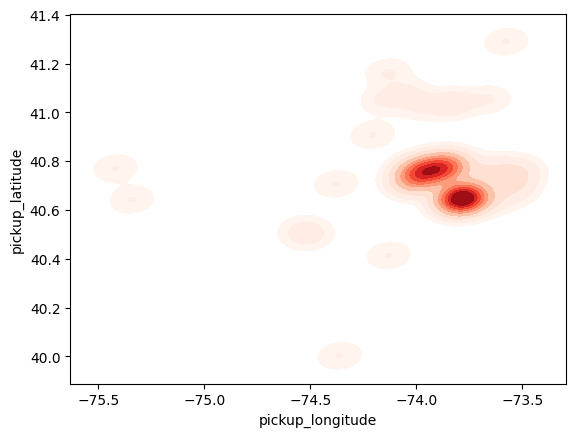

In [ ]:
sns.kdeplot(x=out_of_nyc['pickup_longitude'], y=out_of_nyc['pickup_latitude'], cmap="Reds", shade=True, bw_adjust=.5)


<Axes: xlabel='bearing', ylabel='Count'>

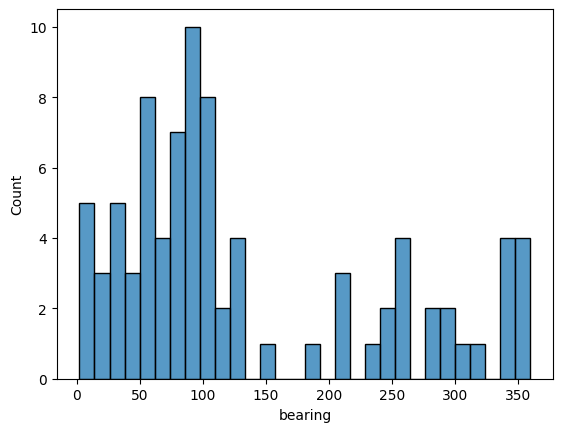

In [ ]:
sns.histplot(out_of_nyc['bearing'], bins=30)


In [101]:
!pip install geohash2

  Preparing metadata (setup.py) ... done
  Created wheel for geohash2: filename=geohash2-1.1-py3-none-any.whl size=15543 sha256=34482828ee9553e8a4748a65fd1a011523cacdd7a29098e265b7206d19f64b6d
  Stored in directory: /root/.cache/pip/wheels/f6/7c/c4/1b3c6fea0ebc53bf730dc86bbee7a713d501455dfb4c1f0623
Successfully built geohash2


In [111]:
import geohash2

# Function to get geohash for a location
def geohash(lat, lon, precision=3):
    return geohash2.encode(lat, lon, precision)

# Apply geohashing to the DataFrame
df['geohash_pick'] = df.apply(lambda row: geohash(row['pickup_latitude'], row['pickup_longitude']), axis=1)

# Now group locations by geohash
#grouped = df.groupby('geohash').agg({'latitude': 'mean', 'longitude': 'mean'})
df['geohash_pick'].value_counts()

,count
geohash_pick,
dr5,174984
dr7,16865
dr4,3


In [112]:
grouped = df.groupby('geohash_pick').agg({'pickup_latitude': 'mean', 'pickup_longitude': 'mean'})
grouped

,pickup_latitude,pickup_longitude
geohash_pick,,
dr4,40.644559,-75.100321
dr5,40.746816,-73.977071
dr7,40.793011,-73.963506


In [113]:
import folium
import pandas as pd

# Assuming 'df' contains the geohash, latitude, and longitude information
# and 'grouped' contains the average latitudes and longitudes for each geohash.

# Create a base map
map_center = [df['pickup_latitude'].mean(), df['pickup_longitude'].mean()]  # Center the map on the mean latitude and longitude
map = folium.Map(location=map_center, zoom_start=12)

# Iterate over the grouped geohashes to plot each cluster
for geohash, group in grouped.iterrows():
    # Get the lat, lon for the center of each geohash
    lat, lon = group['pickup_latitude'], group['pickup_longitude']

    # Create a marker for the geohash
    folium.CircleMarker(
        location=[lat, lon],
        radius=8,
        color='blue',  # You can choose colors for different geohashes
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=f"Geohash: {geohash}"
    ).add_to(map)

# Save map as HTML or display it directly
map


In [117]:
import matplotlib.cm as cm
import matplotlib.colors

# Loop over the original dataframe to plot each location's geohash
for _, row in df.iterrows():
    lat, lon, geohash = row['pickup_latitude'], row['pickup_longitude'], row['geohash_pick']

    # Use a color from the predefined color map
    # Get a colormap (e.g., 'viridis') and normalize it
    cmap = cm.get_cmap('viridis')
    norm = matplotlib.colors.Normalize(vmin=0, vmax=len(df['geohash_pick'].unique()))

    # Get color based on geohash index
    color = cmap(norm(list(df['geohash_pick'].unique()).index(geohash)))

    # Create a marker for each location
    folium.CircleMarker(
        location=[lat, lon],
        radius=3,  # Size of the marker
        color=matplotlib.colors.to_hex(color[:3]),  # Convert RGB to hex using matplotlib.colors.to_hex
        fill=True,
        fill_color=matplotlib.colors.to_hex(color[:3]), # Convert RGB to hex using matplotlib.colors.to_hex
        fill_opacity=0.6,
        popup=f"Geohash: {geohash}, Lat: {lat}, Lon: {lon}"
    ).add_to(map)

# Save the map as an HTML filetering for pickup locationa and dropoff locations

<ipython-input-117-f99b846936ac>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis')


KeyboardInterrupt: 

In [ ]:
map

  geohash_pick  mean_fare  trip_count mode_bearing  \
0          dr4  29.866667           3            E   
1          dr5  11.272999      174984           NE   
2          dr7  10.413090       16865           SW   

                                   trip_class_counts  
0                       {'Long': 2, 'Very Short': 1}  
1  {'Short': 93974, 'Very Short': 81000, 'Medium'...  
2  {'Short': 10080, 'Very Short': 6784, 'Medium': 1}  

Geohash with highest average fare:
geohash_pick                                  dr4
mean_fare                               29.866667
trip_count                                      3
mode_bearing                                    E
trip_class_counts    {'Long': 2, 'Very Short': 1}
Name: 0, dtype: object


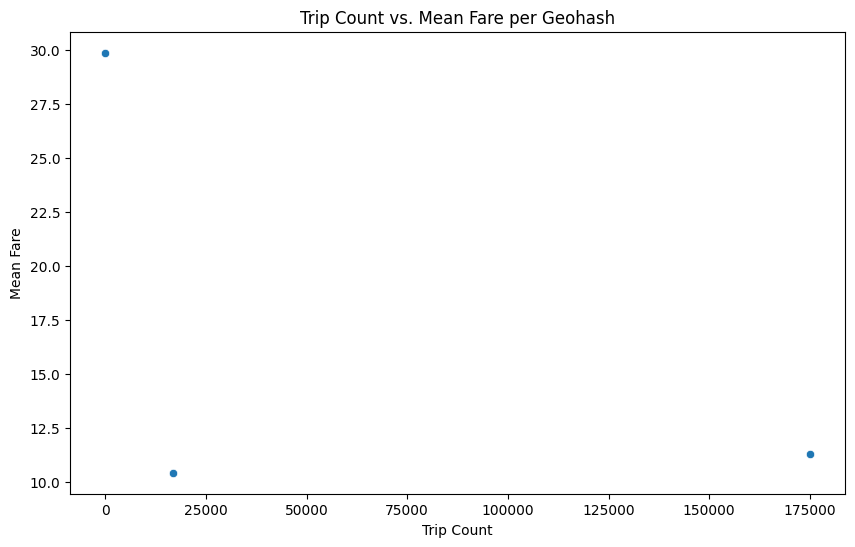

In [127]:
# prompt: analyse these areas fare amout , direction most trips nad trip class count  ('geohash_pick')

import matplotlib.pyplot as plt
# Analyze fare amount, direction of most trips, and trip class count by 'geohash_pick'

# Group data by geohash_pick and calculate relevant statistics
geohash_stats = df.groupby('geohash_pick').agg(
    mean_fare=('fare_amount', 'mean'),
    trip_count=('passenger_count', 'count'),  # Use passenger_count as a proxy for trip count
    mode_bearing=('bearing_class', lambda x: x.mode()[0] if not x.mode().empty else None), # Use mode for bearing class
    trip_class_counts=('Trip Class', lambda x: x.value_counts().to_dict()) # Count per trip class
).reset_index()

# Print the results or further process as needed
print(geohash_stats)


# Example: Find the geohash with the highest average fare
highest_fare_geohash = geohash_stats.loc[geohash_stats['mean_fare'].idxmax()]
print("\nGeohash with highest average fare:")
print(highest_fare_geohash)


# Example: Plot the relationship between fare and trip counts
plt.figure(figsize=(10, 6))
sns.scatterplot(x='trip_count', y='mean_fare', data=geohash_stats)
plt.title('Trip Count vs. Mean Fare per Geohash')
plt.xlabel('Trip Count')
plt.ylabel('Mean Fare')
plt.show()


In [129]:
invalid_coords = df[(df['pickup_latitude'] < 40) | (df['pickup_latitude'] > 42) |
                    (df['pickup_longitude'] < -75) | (df['pickup_longitude'] > -72)]
print(f"Invalid coordinates count: {len(invalid_coords)}")


Invalid coordinates count: 2


# save final csv for dashboard

In [130]:
df.to_csv('uber_DB.csv', index=False)
